In [1]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
from segmentation_models import Unet


Segmentation Models: using `tf.keras` framework.


In [2]:
import numpy as np
from matplotlib import pyplot as plot
from skimage.transform import AffineTransform, warp
from skimage import io, img_as_ubyte
import random
import os
from scipy.ndimage import rotate

import albumentations as A
import cv2

images_to_generate = 1000

In [3]:
main_path = "C:/Users/000501/Desktop/Python/work/thk gifu/train/"
classes =  ['flat_ng', 'flat_ok', 'hollow_nut_ng', 'hollow_nut_ok', 'plate_nut_ng', 'plate_nut_ok']

In [4]:
images_path = main_path + "train_image/"
masks_path = main_path + "train_masks/"

img_augemented_path = main_path + "/aug_img/"
msk_augemented_path = main_path + "/aug_mask/"

os.makedirs(img_augemented_path, exist_ok = True)
os.makedirs(msk_augemented_path, exist_ok = True)

for cls in classes:
    class_mask_path = msk_augemented_path + cls
    os.makedirs(class_mask_path, exist_ok= True)

In [5]:
images = []
masks_label = []

for im in os.listdir(images_path):
    images.append(os.path.join(images_path, im))
    
for msk in os.listdir(masks_path):
    masks_label.append(os.path.join(masks_path, msk))

n = len(masks_label)
masks_dict = {}
for i in range(n):
    # print(masks_label[i])
    masks_dict[f"masks_{i}"] = []
    
    for mask in os.listdir(masks_label[i]):
        masks_dict[f"masks_{i}"].append(os.path.join(masks_label[i], mask))
        
# for imag in masks_dict['masks_0']:
#     print(imag)

print(masks_dict['masks_0'][0])

C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png


In [8]:
i = 0
images_to_generate = 5000

while i <= images_to_generate:
    number = random.randint(0, len(images)-1)
    image = images[number]
    tmp_mask_path = []
    
    aug = A.ReplayCompose([
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.HorizontalFlip(p=1),
        A.Transpose(p=1),
        A.RandomBrightnessContrast(p=0.2),
        A.RandomCrop(500, 500, p = 0.2),
        A.RandomCrop(480, 480, p = 0.2),
        A.RandomCrop(450, 450, p = 0.2),
        A.RandomCrop(430, 430, p = 0.2),
        A.RandomCrop(400, 400, p = 0.2),
        
        A.Blur(blur_limit=(3, 3), p=0.3), 
    #     A.OneOf([
    #         A.RGBShift(),
    #         A.HueSaturationValue()
    # ]),
    ])
    
    for m in range(n):
        tmp_mask_path.append(masks_dict[f"masks_{m}"][number])
    
    # print(image)
    original_mask_path = []
    
    original_image = io.imread(image)   
    data_image = aug(image=original_image)
    
    for p, path in enumerate(tmp_mask_path):
        print(f" mask - {path}")
        original_mask = io.imread(path)
        data_mask = A.ReplayCompose.replay(data_image['replay'], image=original_mask)
        transformed_mask = data_mask['image']
        transformed_mask = cv2.resize(transformed_mask, (640, 640))
        
        new_mask_path = "%s%s/augmented_image_%s.png" %(msk_augemented_path,classes[p], i)
        
        # print(new_mask_path)
        io.imsave(new_mask_path, transformed_mask)
        
        
    # print(data_image['replay'])

    transformed_image = data_image['image']
    transformed_image = cv2.resize(transformed_image, (640, 640))
    
    new_image_path = "%s/augmented_image_%s.png" %(img_augemented_path, i)  
    io.imsave(new_image_path, transformed_image)
  
    i = i+1

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_0.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_0.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_0.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_0.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppD

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppDat

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_5.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_5.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_5.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_5.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppD

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_6.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_6.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_6.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_6.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppD

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_7.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_7.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_7.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_7.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_7.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_8.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_8.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_8.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_8.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_8.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_8.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_9.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_9.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_9.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_9.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_10.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_10.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_10.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_10.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_11.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_11.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_11.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_11.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_12.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_12.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_12.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_12.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_14.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_14.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_14.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_14.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\A

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_15.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_15.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_15.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_15.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_16.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_16.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_16.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_16.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\A

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_18.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_18.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_18.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_18.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_19.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_19.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_19.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_19.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_20.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_20.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_20.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_20.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_21.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_21.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_21.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_21.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_22.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_22.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_22.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_22.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_23.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_23.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_23.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_23.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_24.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_24.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_24.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_24.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_25.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_25.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_25.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_25.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_26.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_26.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_26.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_26.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_27.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_27.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_27.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_27.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_28.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_28.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_28.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_28.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_29.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_29.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_29.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_29.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_30.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_30.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_30.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_30.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_31.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_31.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_31.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_31.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_32.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_32.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_32.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_32.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_32.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_33.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_33.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_33.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_33.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_33.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_33.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_34.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_34.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_34.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_34.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\A

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_35.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_35.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_35.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_35.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_36.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_36.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_36.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_36.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_37.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_37.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_37.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_37.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_38.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_38.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_38.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_38.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_38.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_39.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_39.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_39.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_39.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_39.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_40.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_40.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_40.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_40.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_40.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_41.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_41.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_41.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_41.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_41.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_41.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_42.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_42.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_42.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_42.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_42.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_43.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_43.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_43.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_43.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_43.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_44.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_44.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_44.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_44.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\A

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_45.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_45.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_45.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_45.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_45.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_46.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_46.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_46.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_46.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_46.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_46.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_47.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_47.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_47.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_47.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_47.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_48.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_48.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_48.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_48.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_48.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_49.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_49.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_49.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_49.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_49.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_50.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_50.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_50.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_50.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_50.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_51.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_51.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_51.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_51.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_51.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_51.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_52.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_52.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_52.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_52.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_52.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_53.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_53.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_53.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_53.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_53.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_54.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_54.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_54.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_54.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_54.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_55.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_55.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_55.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_55.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_55.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_55.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_56.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_56.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_56.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_56.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_57.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_57.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_57.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_57.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_57.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_58.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_58.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_58.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_58.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_59.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_59.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_59.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_59.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_60.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_60.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_60.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_60.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_61.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_61.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_61.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_61.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_62.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_62.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_62.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_62.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_62.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_63.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_63.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_63.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_63.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_63.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_64.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_64.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_64.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_64.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_65.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_65.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_65.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_65.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_66.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_66.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_66.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_66.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_67.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_67.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_67.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_67.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_67.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_68.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_68.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_68.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_68.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_68.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_68.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_69.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_69.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_69.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_69.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_70.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_70.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_70.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_70.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\A

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_71.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_71.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_71.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_71.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_72.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_72.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_72.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_72.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_73.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_73.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_73.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_73.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_73.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_74.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_74.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_74.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_74.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_74.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_75.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_75.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_75.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_75.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_75.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_76.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_76.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_76.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_76.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_76.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_77.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_77.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_77.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_77.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_77.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_78.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_78.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_78.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_78.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_78.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_79.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_79.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_79.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_79.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_80.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_80.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_80.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_80.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_80.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_81.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_81.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_81.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_81.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_81.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_82.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_82.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_82.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_82.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_82.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_83.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_83.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_83.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_83.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_83.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_84.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_84.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_84.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_84.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_85.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_85.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_85.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_85.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_86.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_86.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_86.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_86.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_86.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_87.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_87.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_87.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_87.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_87.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_88.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_88.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_88.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_88.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_88.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_89.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_89.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_89.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_89.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_89.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_90.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_90.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_90.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_90.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_90.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_91.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_91.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_91.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_91.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_91.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_91.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_92.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_92.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_92.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_92.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_92.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_93.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_93.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_93.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_93.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_93.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_94.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_94.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_94.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_94.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_94.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_94.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_95.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_95.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_95.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_95.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\A

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_96.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_96.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_96.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_96.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_97.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_97.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_97.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_97.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_97.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_98.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_98.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_98.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_98.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_98.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_99.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_99.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_99.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_99.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_99.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00050

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/th

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\00050

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/th

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\User

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0005

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/th

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/th

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_1941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_1997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_1999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_1999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_1999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_1999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/th

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:56: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_img//augmented_image_2735.png is a low contrast image
  io.imsave(new_image_path, transformed_image)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppDa

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/th

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_2995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_2999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_2999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_2999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_2999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_2999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\U

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Pyth

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_127.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_127.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_3998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_3998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_3999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_3999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_3999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_3999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4001.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4002.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4003.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4004.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4005.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4006.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4007.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4008.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4009.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4010.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4011.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4012.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4013.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4014.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4015.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4016.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4017.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4018.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4019.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4020.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4021.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4022.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4023.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4024.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4025.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4026.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4027.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4028.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4029.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4030.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4031.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4032.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4033.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4034.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4035.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4036.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4037.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4038.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4039.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4040.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4041.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4042.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4043.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4044.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4045.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4046.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4047.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4048.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4049.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4050.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4051.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4052.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4053.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4054.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4055.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4056.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4057.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4058.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4059.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4060.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4061.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4062.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4063.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4064.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4065.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4066.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4067.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4068.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4069.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4070.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4071.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4072.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4073.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4074.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4075.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4076.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4077.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4078.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4079.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4080.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4081.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4082.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4083.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4084.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4085.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4086.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4087.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4088.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4089.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4090.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4091.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4092.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4093.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4094.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4095.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4096.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4097.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4098.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4099.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4100.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4101.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4102.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4103.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4104.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4105.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4106.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4107.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4108.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4109.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4110.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4111.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4112.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4113.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4114.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4115.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4116.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4117.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4118.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4119.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4120.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4121.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4122.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4123.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4124.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4125.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4126.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4127.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4128.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4129.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4130.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4131.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4132.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4133.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4134.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4135.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4136.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4137.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4138.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4139.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4140.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4141.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4142.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4143.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_34.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_34.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4144.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4145.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4146.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4147.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4148.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4149.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4150.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4151.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4152.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4153.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4154.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4155.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4156.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4157.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4158.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4159.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4160.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4161.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4162.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4163.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4164.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4165.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_36.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_36.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4166.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4167.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4168.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4169.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4170.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4171.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4172.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4173.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4174.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4175.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4176.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4177.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4178.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4179.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4180.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4181.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4182.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4183.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4184.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4185.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4186.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4187.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4188.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4189.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4190.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4191.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4192.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4193.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4194.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4195.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4196.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4197.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4198.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4199.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4200.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4201.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4202.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4203.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4204.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4205.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4206.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4207.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4208.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4209.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4210.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4211.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4212.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4213.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4214.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4215.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4216.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4217.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4218.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4219.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4220.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4221.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4222.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4223.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4224.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4225.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4226.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4227.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4228.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4229.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4230.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4231.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4232.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4233.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4234.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4235.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4236.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4237.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4238.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4239.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4240.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4241.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4242.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4243.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4244.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4245.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4246.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4247.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4248.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4249.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4250.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4251.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4252.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4253.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4254.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4255.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4256.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4257.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4258.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4259.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4260.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4261.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4262.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4263.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4264.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4265.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4266.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4267.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4268.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4269.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4270.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4271.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4272.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4273.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4274.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4275.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4276.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4277.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4278.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4279.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4280.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4281.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4282.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4283.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4284.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4285.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4286.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4287.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4288.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4289.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4290.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4291.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4292.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4293.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4294.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4295.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4296.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4297.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4298.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4299.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4300.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4301.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4302.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4303.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4304.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4305.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4306.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4307.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4308.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4309.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4310.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4311.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4312.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4313.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4314.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4315.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4316.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4317.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4318.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4319.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4320.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4321.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4322.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4323.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4324.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4325.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4326.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4327.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_95.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4328.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_95.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4329.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4330.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4331.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4332.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4333.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4334.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4335.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4336.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4337.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4338.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:56: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_img//augmented_image_4338.png is a low contrast image
  io.imsave(new_image_path, transformed_image)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4339.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4340.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4341.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4342.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4343.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_26.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4344.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_26.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4345.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4346.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4347.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4348.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4349.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4350.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_106.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_106.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4351.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4352.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_153.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4353.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_153.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4354.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4355.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4356.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4357.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4358.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4359.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4360.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4361.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4362.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4363.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4364.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4365.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4366.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4367.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4368.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4369.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4370.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4371.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4372.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4373.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4374.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4375.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4376.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4377.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4378.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4379.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4380.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4381.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4382.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4383.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4384.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4385.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4386.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4387.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4388.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4389.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4390.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4391.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4392.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4393.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4394.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4395.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4396.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4397.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4398.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4399.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4400.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4401.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4402.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4403.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4404.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4405.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4406.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4407.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4408.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4409.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4410.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4411.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4412.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4413.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4414.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4415.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4416.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4417.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4418.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4419.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4420.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4421.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4422.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4423.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4424.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4425.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4426.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4427.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4428.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4429.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4430.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_5.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_5.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4431.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4432.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4433.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_152.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_152.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4434.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4435.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4436.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4437.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4438.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4439.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4440.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4441.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4442.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4443.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4444.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4445.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4446.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4447.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4448.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4449.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4450.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4451.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4452.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4453.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4454.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4455.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4456.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4457.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4458.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_79.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4459.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_79.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4460.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4461.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4462.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4463.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4464.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4465.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4466.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4467.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4468.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4469.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4470.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4471.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4472.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4473.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4474.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4475.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4476.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4477.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4478.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_118.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_118.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4479.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4480.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4481.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4482.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4483.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4484.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4485.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4486.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4487.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/wo

C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4488.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4489.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4490.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4491.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4492.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4493.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4494.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4495.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4496.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4497.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4498.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4499.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4500.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4501.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4502.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4503.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4504.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4505.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4506.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4507.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4508.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4509.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4510.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4511.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4512.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4513.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4514.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4515.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4516.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4517.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4518.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4519.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4520.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4521.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4522.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4523.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4524.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4525.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4526.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4527.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4528.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4529.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_165.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4530.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_165.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4531.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_23.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4532.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_23.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4533.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4534.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4535.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4536.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4537.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4538.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4539.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4540.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4541.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4542.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4543.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_39.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_39.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4544.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4545.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_50.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_50.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4546.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4547.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4548.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4549.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4550.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4551.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4552.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4553.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4554.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4555.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4556.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4557.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4558.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4559.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4560.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4561.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4562.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4563.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4564.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4565.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4566.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4567.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4568.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4569.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4570.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4571.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4572.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_2.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_2.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4573.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4574.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4575.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_13.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_13.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4576.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\0

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4577.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4578.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4579.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4580.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4581.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4582.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4583.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4584.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4585.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4586.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_62.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4587.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_62.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4588.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4589.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4590.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_67.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4591.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_67.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_92.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_92.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4592.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4593.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4594.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4595.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4596.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4597.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4598.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4599.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4600.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4601.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4602.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4603.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4604.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4605.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4606.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4607.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_123.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_123.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4608.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4609.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_85.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_85.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4610.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4611.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4612.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4613.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4614.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4615.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4616.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4617.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4618.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_0.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_0.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4619.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4620.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4621.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4622.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4623.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4624.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4625.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4626.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4627.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4628.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4629.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4630.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4631.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4632.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4633.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4634.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4635.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4636.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_77.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_77.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4637.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4638.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4639.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4640.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4641.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4642.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_169.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4643.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_169.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4644.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4645.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4646.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4647.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4648.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_141.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_141.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4649.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4650.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4651.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4652.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4653.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4654.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4655.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4656.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4657.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4658.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4659.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4660.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4661.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4662.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4663.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4664.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_113.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_113.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4665.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4666.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4667.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4668.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4669.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4670.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4671.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4672.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4673.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4674.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4675.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4676.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4677.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4678.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4679.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4680.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4681.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4682.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4683.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4684.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_41.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4685.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_41.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4686.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_93.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_93.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4687.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4688.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_90.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_90.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4689.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4690.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4691.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4692.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_99.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_99.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4693.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4694.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4695.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4696.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4697.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4698.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4699.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4700.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_129.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4701.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_129.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_110.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_110.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4702.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_104.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_104.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4703.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_161.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4704.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_161.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4705.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4706.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_159.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4707.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_159.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4708.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_130.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4709.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_130.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4710.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4711.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4712.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4713.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4714.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_89.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_89.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4715.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_128.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_128.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4716.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4717.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4718.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4719.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4720.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_8.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_8.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4721.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4722.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4723.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_150.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_150.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4724.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4725.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4726.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4727.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_42.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_42.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4728.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4729.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4730.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4731.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4732.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4733.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4734.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4735.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4736.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4737.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4738.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4739.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4740.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4741.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4742.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_87.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_87.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4743.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_10.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4744.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_10.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4745.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4746.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4747.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4748.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4749.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_170.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4750.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_170.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4751.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_101.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_101.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4752.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4753.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4754.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_20.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4755.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_20.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4756.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4757.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4758.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4759.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4760.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4761.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_111.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_111.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4762.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_146.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_146.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4763.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4764.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4765.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_43.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4766.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_43.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4767.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4768.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_78.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_78.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4769.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4770.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_54.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_54.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4771.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4772.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4773.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4774.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4775.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4776.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_164.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_164.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4777.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4778.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4779.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_52.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_52.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4780.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4781.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4782.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4783.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4784.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4785.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_94.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_94.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4786.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4787.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4788.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4789.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4790.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4791.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4792.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4793.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4794.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_140.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_140.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4795.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4796.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4797.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4798.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4799.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4800.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4801.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4802.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4803.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4804.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4805.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4806.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4807.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4808.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4809.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4810.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4811.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4812.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_71.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_71.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4813.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4814.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4815.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_109.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_109.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4816.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4817.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4818.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4819.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4820.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_116.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_116.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4821.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4822.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4823.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4824.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4825.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_64.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4826.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_64.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4827.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4828.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_114.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_114.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4829.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4830.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_28.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_28.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4831.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4832.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4833.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_16.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4834.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_16.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4835.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_107.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_107.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4836.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4837.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4838.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4839.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4840.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4841.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_7.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_7.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4842.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4843.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4844.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_145.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_145.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4845.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_117.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_117.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4846.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4847.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_53.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_53.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4848.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4849.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4850.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4851.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_115.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_115.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4852.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_22.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_22.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4853.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_142.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4854.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_142.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_144.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4855.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_144.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4856.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4857.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4858.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4859.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4860.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_32.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_32.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4861.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_12.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_12.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4862.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4863.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4864.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_74.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_74.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4865.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_63.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_63.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4866.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_60.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4867.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_60.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4868.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4869.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4870.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_29.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4871.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_29.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_102.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_102.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4872.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4873.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4874.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_59.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_59.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4875.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4876.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4877.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_18.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_18.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4878.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_121.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4879.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_121.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4880.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4881.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4882.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_138.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4883.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_138.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4884.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4885.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_38.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_38.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4886.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_125.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_125.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4887.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4888.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_91.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_91.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4889.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_122.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_122.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4890.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_136.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_136.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4891.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_166.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_166.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4892.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_100.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_100.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4893.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4894.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_47.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_47.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4895.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4896.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4897.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_103.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4898.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_103.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4899.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4900.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4901.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_120.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_120.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4902.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_162.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4903.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_162.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_135.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4904.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_135.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_9.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_9.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4905.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_33.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4906.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_33.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4907.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_17.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_17.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4908.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_97.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4909.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_97.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_45.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_45.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4910.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_55.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4911.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_55.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_24.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4912.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_24.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_1.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_1.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4913.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_134.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_134.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4914.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_124.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_124.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4915.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_56.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4916.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_56.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_65.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4917.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_65.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_37.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_37.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4918.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4919.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_88.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_88.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4920.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4921.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4922.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_70.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_70.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4923.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4924.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4925.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_46.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4926.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_46.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_6.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_6.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4927.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_108.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_108.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4928.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_49.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_49.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4929.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_19.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_19.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4930.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4931.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_81.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_81.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4932.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4933.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_48.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4934.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_48.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_84.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_84.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4935.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4936.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_25.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_25.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4937.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_157.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_157.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4938.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_80.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_80.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4939.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_51.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_51.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4940.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_98.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_98.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4941.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_143.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_143.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4942.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_160.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_160.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4943.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_133.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_133.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4944.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4945.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_112.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_112.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4946.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_66.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4947.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_66.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_86.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_86.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4948.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4949.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4950.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4951.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_151.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4952.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_151.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4953.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_131.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_131.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4954.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4955.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_44.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_44.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4956.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4957.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_156.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_156.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4958.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_96.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_96.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4959.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4960.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_105.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_105.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4961.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_69.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_69.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4962.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4963.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_21.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_21.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4964.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4965.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_61.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4966.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_61.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_119.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_119.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4967.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_149.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_149.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4968.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_58.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_58.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4969.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_155.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_155.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4970.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_168.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_168.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4971.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_167.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4972.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_167.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_132.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4973.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_132.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_57.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_57.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4974.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_82.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_82.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4975.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_15.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4976.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_15.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4977.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_31.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4978.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_31.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_126.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_126.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4979.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_27.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_27.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4980.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_30.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_30.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4981.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_68.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_68.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4982.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_4.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4983.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_4.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_35.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_35.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4984.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_83.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4985.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_83.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_76.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_76.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4986.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_148.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4987.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_148.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_40.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_40.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4988.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_72.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4989.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_72.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_3.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_3.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4990.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_154.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_154.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4991.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_139.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4992.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_139.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_137.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_137.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4993.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_11.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_11.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4994.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_163.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4995.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_163.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_147.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_147.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4996.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_14.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4997.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_14.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_75.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_75.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_4998.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_4999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_73.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_4999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_4999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_4999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_4999.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\

 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_73.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ng\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ng/augmented_image_5000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/flat_ok/augmented_image_5000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ng/augmented_image_5000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/hollow_nut_ok/augmented_image_5000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/flat_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ng\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/hollow_nut_ok\image_158.png
 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ng\image_158.png


C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ng/augmented_image_5000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)
C:\Users\000501\AppData\Local\Temp\ipykernel_16916\2090579731.py:47: UserWarning: C:/Users/000501/Desktop/Python/work/thk gifu/train//aug_mask/plate_nut_ok/augmented_image_5000.png is a low contrast image
  io.imsave(new_mask_path, transformed_mask)


 mask - C:/Users/000501/Desktop/Python/work/thk gifu/train/train_masks/plate_nut_ok\image_158.png


In [ ]:
import random 
import cv2 
import matplotlib.pyplot as plt 
import albumentations as A

In [ ]:
def visualize(image): 
    plt.figure(figsize=(5, 5)) 
    plt.axis('off') 
    plt.imshow(image)

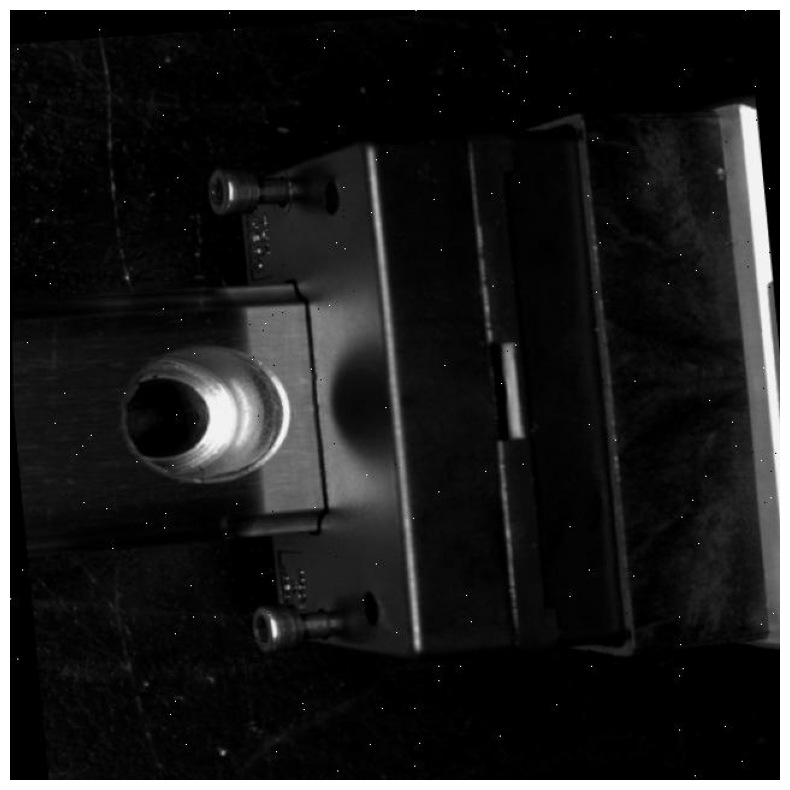

In [ ]:
image = cv2.imread('C:/Users/000501/Desktop/Python/work/thk gifu/train/train_image/image_0.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
visualize(image)

In [ ]:
transform = A.ReplayCompose([
    A.Resize(512, 512, always_apply=True),
    A.RandomCrop(500, 500, always_apply=True),
    A.OneOf([
        A.RGBShift(),
        A.HueSaturationValue()
    ]),
])

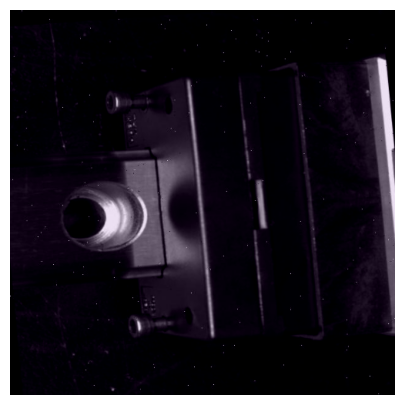

In [ ]:
random.seed(7)
data = transform(image=image)
visualize(data['image'])

In [ ]:
data['replay']

{'__class_fullname__': 'ReplayCompose',
 'params': None,
 'transforms': [{'__class_fullname__': 'Resize',
   'always_apply': True,
   'p': 1,
   'height': 512,
   'width': 512,
   'interpolation': 1,
   'params': {},
   'applied': True},
  {'__class_fullname__': 'RandomCrop',
   'always_apply': True,
   'p': 1.0,
   'height': 500,
   'width': 500,
   'params': {'h_start': 0.15084917392450192, 'w_start': 0.6509344730398537},
   'applied': True},
  {'__class_fullname__': 'OneOf',
   'params': None,
   'transforms': [{'__class_fullname__': 'RGBShift',
     'always_apply': False,
     'p': 0.5,
     'r_shift_limit': (-20, 20),
     'g_shift_limit': (-20, 20),
     'b_shift_limit': (-20, 20),
     'params': {'r_shift': -5.372443323496579,
      'g_shift': -17.680043009011726,
      'b_shift': 0.2974293275768112},
     'applied': True},
    {'__class_fullname__': 'HueSaturationValue',
     'always_apply': False,
     'p': 0.5,
     'hue_shift_limit': (-20, 20),
     'sat_shift_limit': (-30, 